In [ ]:
!pip3 install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121

Looking in indexes: https://download.pytorch.org/whl/cu121


In [ ]:
!pip install numpy matplotlib

In [ ]:
!pip install opendatasets --upgrade --quiet

In [ ]:
import opendatasets as od

dataset_url = 'https://www.kaggle.com/datasets/badasstechie/celebahq-resized-256x256'
od.download(dataset_url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: shrruthilayag
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/badasstechie/celebahq-resized-256x256


100%|██████████| 283M/283M [00:14<00:00, 20.7MB/s]


In [ ]:
import os

DATA_DIR = '/content/celebahq-resized-256x256'
print(os.listdir(DATA_DIR))

['celeba_hq_256']


In [ ]:
print(os.listdir(DATA_DIR+'/celeba_hq_256')[:10])

['22692.jpg', '17265.jpg', '12596.jpg', '01751.jpg', '05230.jpg', '12381.jpg', '20183.jpg', '05903.jpg', '16850.jpg', '19371.jpg']


In [ ]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [ ]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [ ]:
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [ ]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [ ]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

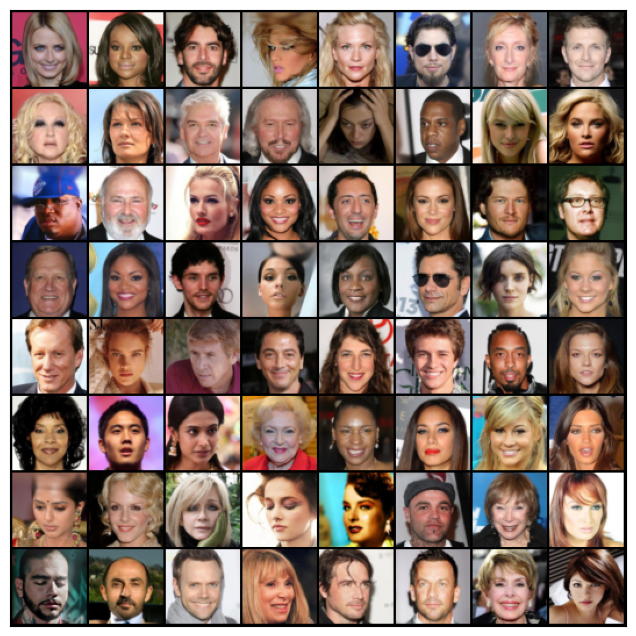

In [ ]:
show_batch(train_dl)

In [ ]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [ ]:
device = get_default_device()
device

device(type='cuda')

In [ ]:
train_dl = DeviceDataLoader(train_dl, device)

In [ ]:
import torch.nn as nn

In [ ]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [ ]:
discriminator = to_device(discriminator, device)

In [ ]:
latent_size = 128

In [ ]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

torch.Size([128, 3, 64, 64])


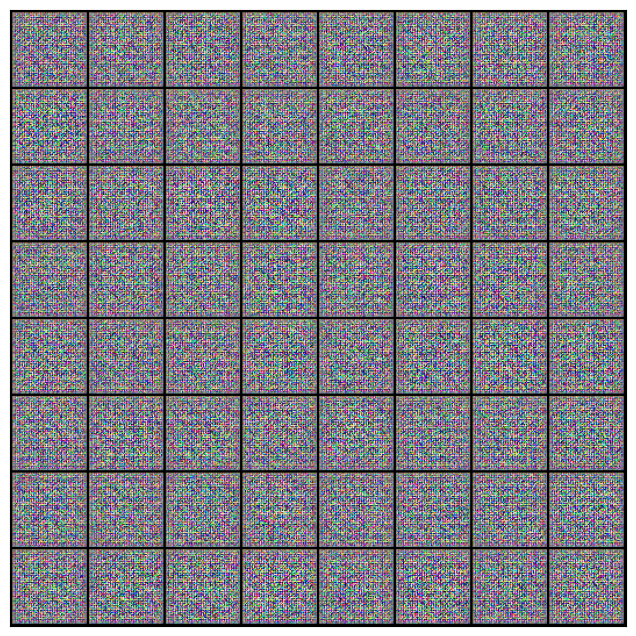

In [ ]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [ ]:
generator = to_device(generator, device)

In [ ]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [ ]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)

    # Update generator weights
    loss.backward()
    opt_g.step()

    return loss.item()

In [ ]:
from torchvision.utils import save_image

In [ ]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [ ]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [ ]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Saving generated-images-0000.png


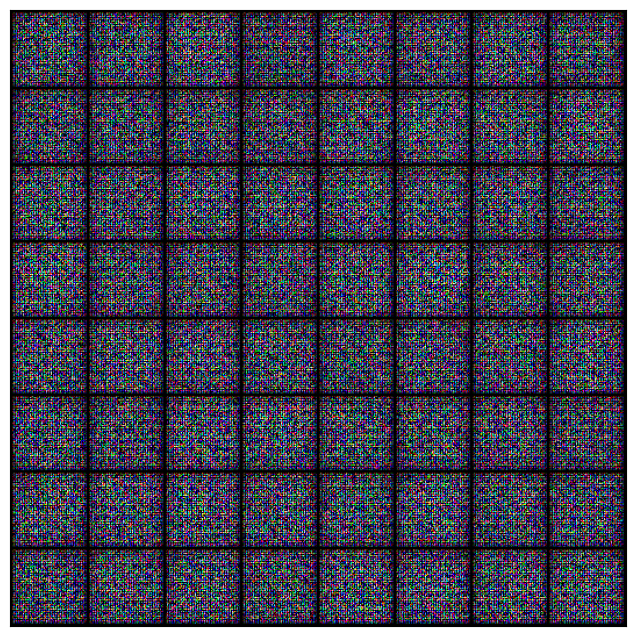

In [ ]:
save_samples(0, fixed_latent)

In [ ]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [ ]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()

    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)

        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)

        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)

    return losses_g, losses_d, real_scores, fake_scores

In [ ]:
lr = 0.0002
epochs = 100

In [ ]:
history = fit(epochs, lr)

  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [1/100], loss_g: 5.9346, loss_d: 0.0281, real_score: 0.9813, fake_score: 0.0076
Saving generated-images-0001.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [2/100], loss_g: 4.5843, loss_d: 0.1950, real_score: 0.8693, fake_score: 0.0439
Saving generated-images-0002.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [3/100], loss_g: 3.9959, loss_d: 0.2616, real_score: 0.8847, fake_score: 0.1073
Saving generated-images-0003.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [4/100], loss_g: 3.2348, loss_d: 0.6816, real_score: 0.6575, fake_score: 0.0409
Saving generated-images-0004.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [5/100], loss_g: 8.5922, loss_d: 0.9594, real_score: 0.9661, fake_score: 0.5598
Saving generated-images-0005.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [6/100], loss_g: 4.9489, loss_d: 0.7355, real_score: 0.8879, fake_score: 0.4051
Saving generated-images-0006.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [7/100], loss_g: 3.0757, loss_d: 0.3708, real_score: 0.8608, fake_score: 0.1728
Saving generated-images-0007.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [8/100], loss_g: 3.2789, loss_d: 0.3614, real_score: 0.7640, fake_score: 0.0529
Saving generated-images-0008.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [9/100], loss_g: 5.0841, loss_d: 0.4368, real_score: 0.9826, fake_score: 0.3125
Saving generated-images-0009.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [10/100], loss_g: 2.1408, loss_d: 0.8565, real_score: 0.5114, fake_score: 0.0518
Saving generated-images-0010.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [11/100], loss_g: 3.1474, loss_d: 0.3735, real_score: 0.9544, fake_score: 0.2508
Saving generated-images-0011.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [12/100], loss_g: 1.8590, loss_d: 0.4737, real_score: 0.8474, fake_score: 0.2173
Saving generated-images-0012.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [13/100], loss_g: 0.6254, loss_d: 0.8222, real_score: 0.5531, fake_score: 0.1397
Saving generated-images-0013.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [14/100], loss_g: 1.1549, loss_d: 0.4136, real_score: 0.7339, fake_score: 0.0644
Saving generated-images-0014.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [15/100], loss_g: 3.9894, loss_d: 0.7076, real_score: 0.9350, fake_score: 0.4341
Saving generated-images-0015.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [16/100], loss_g: 2.3181, loss_d: 0.3605, real_score: 0.7577, fake_score: 0.0551
Saving generated-images-0016.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [17/100], loss_g: 3.4018, loss_d: 0.3413, real_score: 0.8371, fake_score: 0.1216
Saving generated-images-0017.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [18/100], loss_g: 2.0901, loss_d: 0.3679, real_score: 0.8076, fake_score: 0.1260
Saving generated-images-0018.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [19/100], loss_g: 4.0923, loss_d: 0.3455, real_score: 0.9076, fake_score: 0.2007
Saving generated-images-0019.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [20/100], loss_g: 2.3321, loss_d: 0.3942, real_score: 0.8030, fake_score: 0.1348
Saving generated-images-0020.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [21/100], loss_g: 2.6484, loss_d: 0.5410, real_score: 0.6887, fake_score: 0.0771
Saving generated-images-0021.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [22/100], loss_g: 4.9365, loss_d: 0.5234, real_score: 0.9480, fake_score: 0.3357
Saving generated-images-0022.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [23/100], loss_g: 4.1975, loss_d: 0.4282, real_score: 0.9556, fake_score: 0.2853
Saving generated-images-0023.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [24/100], loss_g: 2.3730, loss_d: 0.3038, real_score: 0.8935, fake_score: 0.1606
Saving generated-images-0024.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [25/100], loss_g: 4.6047, loss_d: 0.2884, real_score: 0.9669, fake_score: 0.1992
Saving generated-images-0025.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [26/100], loss_g: 3.4883, loss_d: 0.3779, real_score: 0.8517, fake_score: 0.1687
Saving generated-images-0026.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [27/100], loss_g: 3.4945, loss_d: 0.1891, real_score: 0.9268, fake_score: 0.0972
Saving generated-images-0027.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [28/100], loss_g: 3.5846, loss_d: 0.5019, real_score: 0.9151, fake_score: 0.2959
Saving generated-images-0028.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [29/100], loss_g: 3.8978, loss_d: 0.2258, real_score: 0.8445, fake_score: 0.0457
Saving generated-images-0029.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [30/100], loss_g: 1.7050, loss_d: 0.2531, real_score: 0.8754, fake_score: 0.0955
Saving generated-images-0030.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [31/100], loss_g: 3.2976, loss_d: 0.1501, real_score: 0.9597, fake_score: 0.0977
Saving generated-images-0031.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [32/100], loss_g: 3.9914, loss_d: 0.2718, real_score: 0.9373, fake_score: 0.1699
Saving generated-images-0032.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [33/100], loss_g: 4.5244, loss_d: 0.3404, real_score: 0.9017, fake_score: 0.1882
Saving generated-images-0033.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [34/100], loss_g: 4.0449, loss_d: 0.1993, real_score: 0.9621, fake_score: 0.1389
Saving generated-images-0034.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [35/100], loss_g: 4.8359, loss_d: 0.4082, real_score: 0.9263, fake_score: 0.2340
Saving generated-images-0035.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [36/100], loss_g: 3.7391, loss_d: 0.5117, real_score: 0.8019, fake_score: 0.1885
Saving generated-images-0036.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [37/100], loss_g: 3.1960, loss_d: 0.2766, real_score: 0.8686, fake_score: 0.1007
Saving generated-images-0037.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [38/100], loss_g: 2.2246, loss_d: 0.7481, real_score: 0.8058, fake_score: 0.3065
Saving generated-images-0038.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [39/100], loss_g: 3.1009, loss_d: 0.1644, real_score: 0.9849, fake_score: 0.1287
Saving generated-images-0039.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [40/100], loss_g: 3.4013, loss_d: 0.2346, real_score: 0.9024, fake_score: 0.1102
Saving generated-images-0040.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [41/100], loss_g: 4.3794, loss_d: 0.2622, real_score: 0.9078, fake_score: 0.1374
Saving generated-images-0041.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [42/100], loss_g: 4.5306, loss_d: 0.1399, real_score: 0.9403, fake_score: 0.0695
Saving generated-images-0042.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [43/100], loss_g: 2.8514, loss_d: 0.6424, real_score: 0.8221, fake_score: 0.2781
Saving generated-images-0043.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [44/100], loss_g: 2.7915, loss_d: 0.1714, real_score: 0.8843, fake_score: 0.0372
Saving generated-images-0044.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [45/100], loss_g: 2.9784, loss_d: 0.2497, real_score: 0.8830, fake_score: 0.0905
Saving generated-images-0045.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [46/100], loss_g: 2.6409, loss_d: 0.1068, real_score: 0.9578, fake_score: 0.0581
Saving generated-images-0046.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [47/100], loss_g: 4.7053, loss_d: 0.2198, real_score: 0.9775, fake_score: 0.1633
Saving generated-images-0047.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [48/100], loss_g: 2.5823, loss_d: 0.3228, real_score: 0.8045, fake_score: 0.0459
Saving generated-images-0048.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [49/100], loss_g: 0.1615, loss_d: 4.8917, real_score: 0.0153, fake_score: 0.0002
Saving generated-images-0049.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [50/100], loss_g: 4.9959, loss_d: 0.1531, real_score: 0.9899, fake_score: 0.1226
Saving generated-images-0050.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [51/100], loss_g: 4.3947, loss_d: 0.0857, real_score: 0.9455, fake_score: 0.0260
Saving generated-images-0051.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [52/100], loss_g: 3.2801, loss_d: 0.3347, real_score: 0.8611, fake_score: 0.1443
Saving generated-images-0052.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [53/100], loss_g: 3.8532, loss_d: 0.1138, real_score: 0.9540, fake_score: 0.0583
Saving generated-images-0053.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [54/100], loss_g: 3.9951, loss_d: 0.1338, real_score: 0.9116, fake_score: 0.0331
Saving generated-images-0054.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [55/100], loss_g: 4.8556, loss_d: 0.1149, real_score: 0.9768, fake_score: 0.0805
Saving generated-images-0055.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [56/100], loss_g: 4.9466, loss_d: 0.0719, real_score: 0.9603, fake_score: 0.0278
Saving generated-images-0056.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [57/100], loss_g: 3.6243, loss_d: 1.8433, real_score: 0.9148, fake_score: 0.6770
Saving generated-images-0057.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [58/100], loss_g: 2.1245, loss_d: 0.3019, real_score: 0.7931, fake_score: 0.0444
Saving generated-images-0058.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [59/100], loss_g: 2.9585, loss_d: 0.4367, real_score: 0.9453, fake_score: 0.2447
Saving generated-images-0059.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [60/100], loss_g: 3.9014, loss_d: 0.1317, real_score: 0.9385, fake_score: 0.0566
Saving generated-images-0060.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [61/100], loss_g: 3.2219, loss_d: 0.2100, real_score: 0.8859, fake_score: 0.0709
Saving generated-images-0061.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [62/100], loss_g: 4.9677, loss_d: 0.2973, real_score: 0.9759, fake_score: 0.2076
Saving generated-images-0062.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [63/100], loss_g: 2.1120, loss_d: 0.3439, real_score: 0.8107, fake_score: 0.0860
Saving generated-images-0063.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [64/100], loss_g: 4.8288, loss_d: 0.0933, real_score: 0.9373, fake_score: 0.0254
Saving generated-images-0064.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [65/100], loss_g: 3.5977, loss_d: 0.1414, real_score: 0.9197, fake_score: 0.0397
Saving generated-images-0065.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [66/100], loss_g: 3.1800, loss_d: 0.1376, real_score: 0.9273, fake_score: 0.0524
Saving generated-images-0066.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [67/100], loss_g: 4.0685, loss_d: 0.1744, real_score: 0.9221, fake_score: 0.0738
Saving generated-images-0067.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [68/100], loss_g: 5.6305, loss_d: 0.0691, real_score: 0.9440, fake_score: 0.0096
Saving generated-images-0068.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [69/100], loss_g: 2.9126, loss_d: 0.9623, real_score: 0.8835, fake_score: 0.4657
Saving generated-images-0069.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [70/100], loss_g: 3.8659, loss_d: 0.1031, real_score: 0.9519, fake_score: 0.0474
Saving generated-images-0070.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [71/100], loss_g: 3.9291, loss_d: 0.0855, real_score: 0.9417, fake_score: 0.0211
Saving generated-images-0071.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [72/100], loss_g: 4.0682, loss_d: 0.4034, real_score: 0.9514, fake_score: 0.2516
Saving generated-images-0072.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [73/100], loss_g: 5.2011, loss_d: 0.1121, real_score: 0.9873, fake_score: 0.0879
Saving generated-images-0073.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [74/100], loss_g: 2.8253, loss_d: 1.6556, real_score: 0.3718, fake_score: 0.0205
Saving generated-images-0074.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [75/100], loss_g: 5.8652, loss_d: 0.0881, real_score: 0.9946, fake_score: 0.0741
Saving generated-images-0075.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [76/100], loss_g: 3.8334, loss_d: 0.1611, real_score: 0.9215, fake_score: 0.0628
Saving generated-images-0076.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [77/100], loss_g: 2.9518, loss_d: 0.1486, real_score: 0.8970, fake_score: 0.0296
Saving generated-images-0077.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [78/100], loss_g: 1.1869, loss_d: 0.6762, real_score: 0.6728, fake_score: 0.1680
Saving generated-images-0078.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [79/100], loss_g: 3.4639, loss_d: 0.1342, real_score: 0.9020, fake_score: 0.0197
Saving generated-images-0079.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [80/100], loss_g: 2.5708, loss_d: 1.1266, real_score: 0.7770, fake_score: 0.3409
Saving generated-images-0080.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [81/100], loss_g: 4.1407, loss_d: 0.1261, real_score: 0.9246, fake_score: 0.0363
Saving generated-images-0081.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [82/100], loss_g: 2.9295, loss_d: 0.8787, real_score: 0.9046, fake_score: 0.4493
Saving generated-images-0082.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [83/100], loss_g: 2.7532, loss_d: 0.1643, real_score: 0.8980, fake_score: 0.0460
Saving generated-images-0083.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [84/100], loss_g: 3.7100, loss_d: 0.0838, real_score: 0.9574, fake_score: 0.0364
Saving generated-images-0084.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [85/100], loss_g: 3.7853, loss_d: 0.1288, real_score: 0.8968, fake_score: 0.0133
Saving generated-images-0085.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [86/100], loss_g: 5.0687, loss_d: 0.0587, real_score: 0.9554, fake_score: 0.0116
Saving generated-images-0086.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [87/100], loss_g: 3.3677, loss_d: 0.1017, real_score: 0.9266, fake_score: 0.0205
Saving generated-images-0087.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [88/100], loss_g: 2.0836, loss_d: 0.3378, real_score: 0.7903, fake_score: 0.0447
Saving generated-images-0088.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [89/100], loss_g: 4.1983, loss_d: 0.0987, real_score: 0.9418, fake_score: 0.0312
Saving generated-images-0089.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [90/100], loss_g: 4.1622, loss_d: 0.1425, real_score: 0.9265, fake_score: 0.0545
Saving generated-images-0090.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [91/100], loss_g: 5.7648, loss_d: 0.0625, real_score: 0.9711, fake_score: 0.0304
Saving generated-images-0091.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [92/100], loss_g: 5.5323, loss_d: 0.0481, real_score: 0.9892, fake_score: 0.0343
Saving generated-images-0092.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [93/100], loss_g: 3.4072, loss_d: 0.1855, real_score: 0.9347, fake_score: 0.0983
Saving generated-images-0093.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [94/100], loss_g: 4.1554, loss_d: 0.1805, real_score: 0.9079, fake_score: 0.0600
Saving generated-images-0094.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [95/100], loss_g: 5.8236, loss_d: 0.0250, real_score: 0.9929, fake_score: 0.0174
Saving generated-images-0095.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [96/100], loss_g: 4.7074, loss_d: 0.1083, real_score: 0.9544, fake_score: 0.0527
Saving generated-images-0096.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [97/100], loss_g: 5.7585, loss_d: 0.1224, real_score: 0.9882, fake_score: 0.0945
Saving generated-images-0097.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [98/100], loss_g: 2.7339, loss_d: 0.2458, real_score: 0.8235, fake_score: 0.0270
Saving generated-images-0098.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [99/100], loss_g: 4.5675, loss_d: 0.0646, real_score: 0.9930, fake_score: 0.0524
Saving generated-images-0099.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [100/100], loss_g: 2.7109, loss_d: 0.1410, real_score: 0.8946, fake_score: 0.0197
Saving generated-images-0100.png


In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

In [ ]:
# Save the model checkpoints
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

In [ ]:
from IPython.display import Image

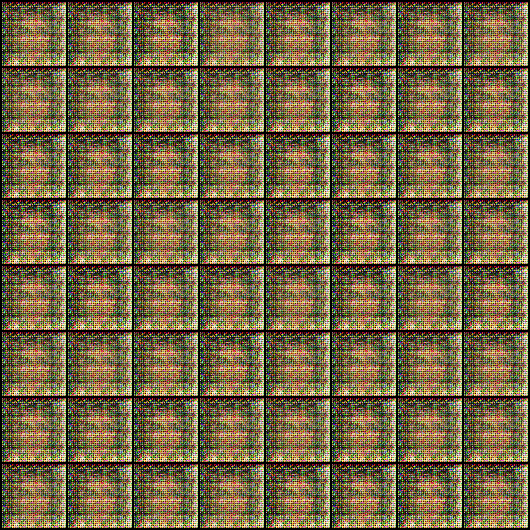

In [ ]:
Image('./generated/generated-images-0001.png')

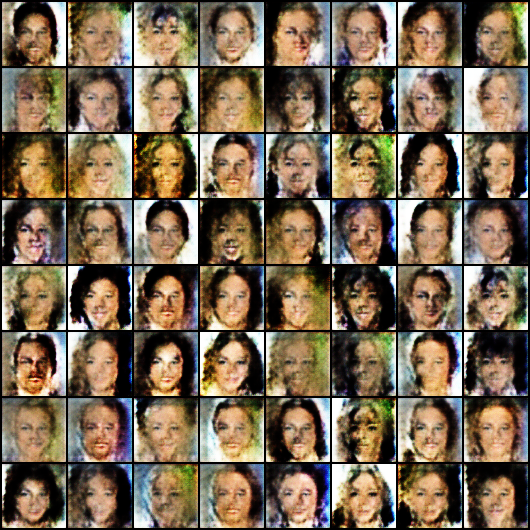

In [ ]:
Image('./generated/generated-images-0005.png')

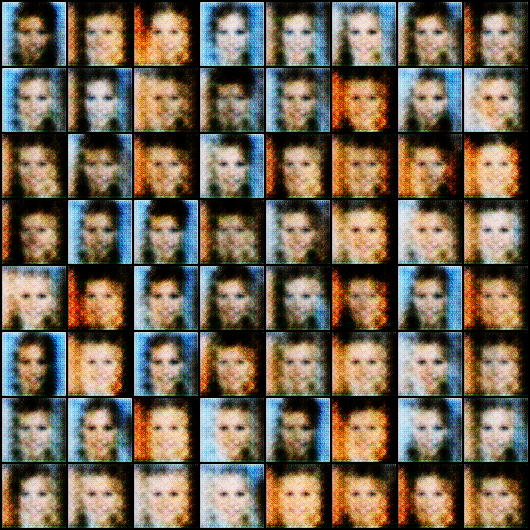

In [ ]:
Image('./generated/generated-images-0002.png')

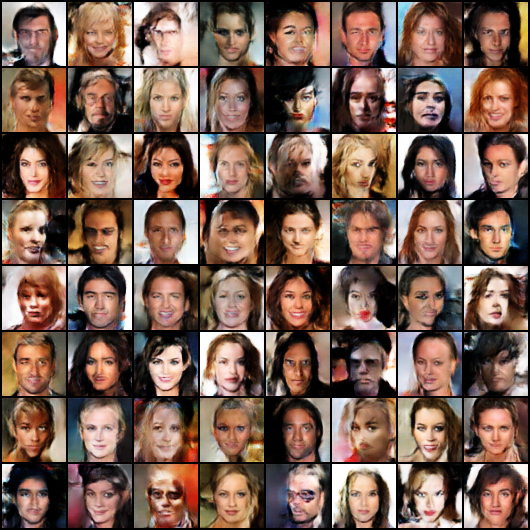

In [ ]:
Image('./generated/generated-images-0020.png')

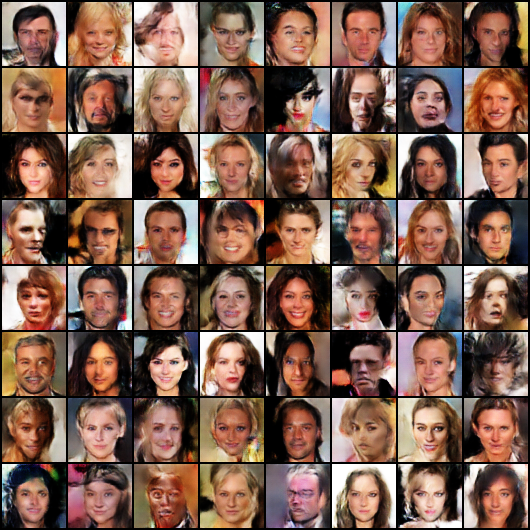

In [ ]:
Image('./generated/generated-images-0025.png')

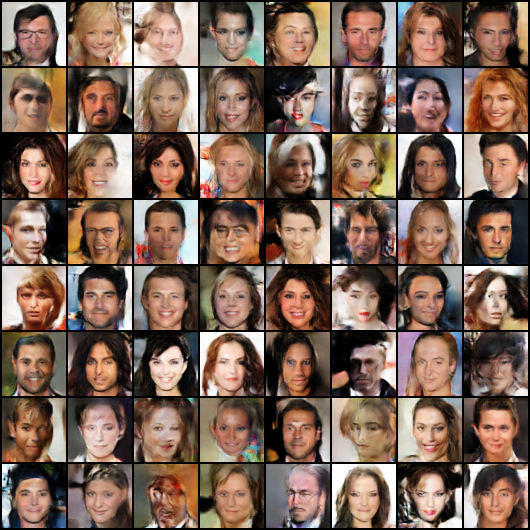

In [ ]:
Image('./generated/generated-images-0035.png')

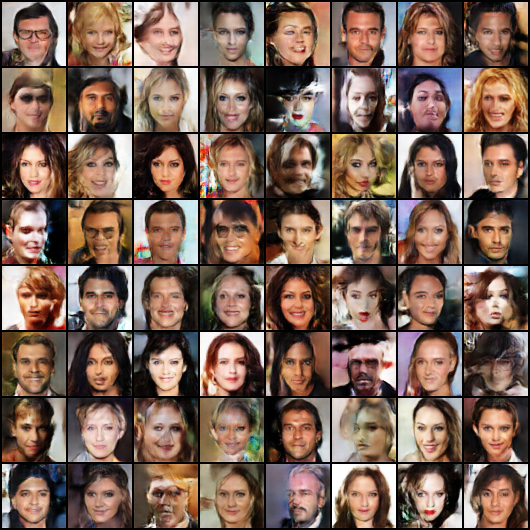

In [ ]:
Image('./generated/generated-images-0045.png')

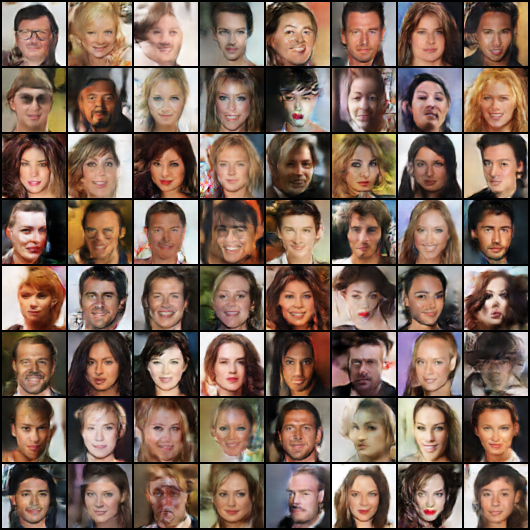

In [ ]:
Image('./generated/generated-images-0055.png')

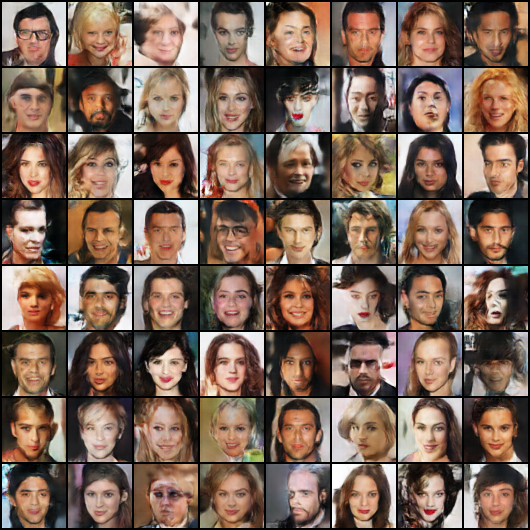

In [ ]:
Image('./generated/generated-images-0075.png')

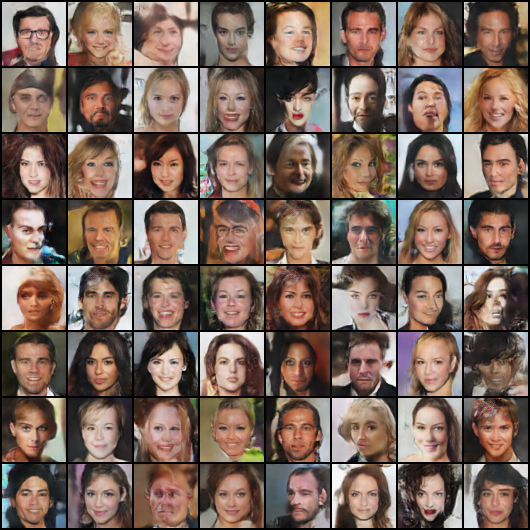

In [ ]:
Image('./generated/generated-images-0099.png')

In [ ]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

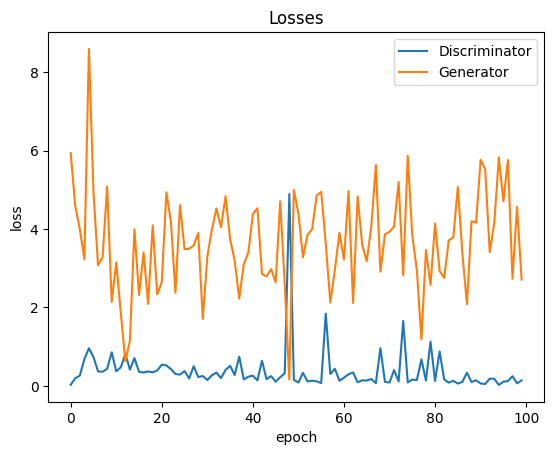

In [ ]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

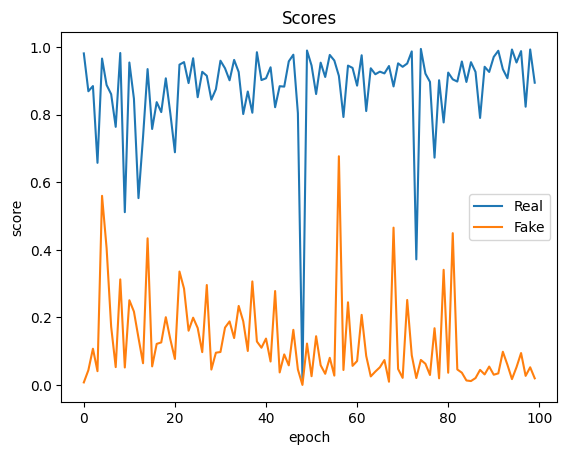

In [ ]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');